План исследования "Рынок заведений общественного питания Москвы"
1. Загрузка данных, изучение общей информации и подготовка к анализу:
* Изучить типы данных и проверка общей информации;
* Найти общее количество заведений;
* Написать выводы по пункту 1.

2. Выполнение предобработки данных:
* Изучить дубликаты в данных. Попробывать их обработать;
* Создать столбец street с названиями улиц из столбца с адресом;
* Создать столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    - логическое значение True — если заведение работает ежедневно и круглосуточно;
    - логическое значение False — в противоположном случае.
* Написать выводы по пункту 2.

3. Исследовательский анализ данных.
- 3.1.Найдем категории заведений представленых в данных. Исследуем количество объектов общественного питания по категориям. Построим визуализации. Проверим распределение заведений по категориям.
- 3.2. Исследуем количество посадочных мест в местах по категориям. Построим визуализации, проанализируем результаты и сделаем выводы.
- 3.3. Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Найдем каких заведений больше.
- 3.4. Найдем категории заведений, которые чаще являются сетевыми. Исследуем данные и построим график.
- 3.5. Найдем топ-15 популярных сетей в Москве. Под популярностью будем считать количество заведений этой сети в регионе. Построим визуализацию. 
- 3.6. Найдем административные районы Москвы, которые присутствуют в датасете. Найдем общее количество заведений и количество заведений каждой категории по районам. Проиллюстрируем полученные результаты.
- 3.7. Визуализируем распределение средних рейтингов по категориям заведений. Разберемся как различаются усреднённые рейтинги в разных типах общепита.
- 3.8. Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.
- 3.9. Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
- 3.10. Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. Попробуем проиллюстрировать эту информацию одним графиком.
- 3.11. Найдем улицы, на которых находится только один объект общепита.
- 3.12. Посчитаем медиану значений средних чеков заведений для каждого района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены и как удалённость от центра влияет на цены в заведениях. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?
- 3.13. Найдем часы работы кофеин с высоким рейтингом
- 3.14. Написать выводы по пункту 3.

4. Цель - открытие кофейни
* Найдем сколько всего кофеен в датасете, в каких районах их больше всего и каковы особенности их расположения.
* Проверим круглосуточные кофейни.
* Найдем  рейтинги кофеен и их распределение по районам.
* Найдем на какую стоимость чашки капучино стоит ориентироваться при открытии.
* Найдем улицы, на которых нет или есть 1 кофейня
* Построим визуализации.
* Написать выводы по пункту 4.

5. Написать рекомендацию.

1. Загрузка данных, изучение общей информации и подготовка к анализу.

In [1]:
# Импортируем библиотеки для работы с файлом и графиками
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from folium import Map, Choropleth
from folium import Map, Marker
from plotly import graph_objects as go

In [2]:
# Сразу преобразуем экспоненциальный формат представления чисел и избавимся от лишних знаков после запятых.
pd.set_option('display.float_format', '{:,.2f}'.format)

In [3]:
# Загружаем данные из csv-файла в датафрейм c помощью библиотеки pandas 
try:
    data = pd.read_csv("D:/DA_42_Learning/Projects/S5_Istoriy_s_pomoschjy_danniysch/moscow_places.csv")
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [4]:
# Изучим типы данных и общую информацию о полученном датафрейме
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
# Проверим данные на явные дубликаты
data.duplicated().sum()

0

In [6]:
# Проверим на неявные дубликаты по столбцам name и address
data[data[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Дубликатов пока нет.
Попробую привести к нижнем регистру эти столбцы

In [7]:
# Приведу столбцы name и address к нижнему регистру
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

In [8]:
# Проверю еще раз на неявные дубликаты
data[data[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.81,37.50,4.20,NaN,NaN,NaN,NaN,0,188.00
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.81,37.50,4.20,NaN,NaN,NaN,NaN,1,188.00
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,0,150.00
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.81,37.64,4.40,NaN,NaN,NaN,NaN,1,150.00
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.74,37.41,4.10,NaN,NaN,NaN,NaN,1,276.00
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,0,276.00


Есть 4 дубликата! Данные по одним и тем же заведения разнятся, в частности время работы.
Проверю по яндекс картам:
189 и 215 строчка. В парке есть 2 кафешки с этим адресом:

* Get and fly https://yandex.ru/maps/-/CDWtvMpO
* Кафе https://yandex.ru/maps/-/CDWtvJ6T

Оставлю обе строчки, но переименую 189, так как режим работы соответствует яндекс картам.

In [9]:
# Переименую 189 строчку:
data.loc[189, 'name'] = data.loc[189, 'name'].replace('кафе','Get and fly')

Ресторан more poke. По этому адресу сейчас другое заведение https://yandex.ru/maps/-/CDWtzH~n
Удалю стрчоку 1511, так как по остальным данным они одинаковые, а время работы у 1430 строчки приятнее читается.

раковарня клешни и хвосты https://yandex.ru/maps/-/CDWt747~ сейчас работает с 12 до 00. Удалю 2420 строчку. В ней не верное время работы.   

хлеб да выпечка удалю 3109 строчку, т.к. в ней нет времени работы.

In [10]:
# Удалю выявленные дубликаты
data = data.drop(index= [1511, 2420 ,3109])
data.reset_index(drop=True)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8398,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.67,37.55,4.40,NaN,NaN,NaN,NaN,0,86.00
8399,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.64,37.66,4.80,NaN,NaN,NaN,NaN,0,150.00
8400,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,3.90,NaN,Средний счёт:от 150 ₽,150.00,NaN,0,150.00
8401,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,4.20,NaN,NaN,NaN,NaN,1,150.00


In [11]:
# Проверю в третий раз на неявные дубликаты
data[data[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Неявных дубликатов больше нет.

In [12]:
# Проверим уникальные значения названий заведений общественного питания столбца name
data['name'].value_counts().sort_values(ascending=False)

name
кафе                  188
шоколадница           120
домино'с пицца         77
додо пицца             74
one price coffee       72
                     ... 
наш самарканд           1
премьера                1
кафе в зимнем саду      1
мелодия                 1
kebab time              1
Name: count, Length: 5513, dtype: int64

In [13]:
# Продолжим изучать значения столбца name
data['name'].describe()

count     8403
unique    5513
top       кафе
freq       188
Name: name, dtype: object

Выводы по пункту 1:
* Типы данных по столбцам отражены корректно. Названия столбцов соответствуют правилу красивого кода;
* Явных дубликатов в данных не обнаружено;
* В данных есть 4 неявных дубликата. В одной паре дубликатов изменил название кафе. В остальных удалил по одному дубликату.
* Всего в данных 8403 строчек и есть пропуски;
* Количество уникальных названий заведений общественного питания в исследовании состаляет 5614. Самое популярное заведение - кафе.

2. Выполнение предобработки данных.

In [14]:
# Создаем копию датасета до преобразования (перед обработкой пропусков сделаем контроль размера датасета до и после обработки)
temp = data.copy() 
len(temp)

8403

In [15]:
# Найдем и изучим пропущенные значения в столбцах:
data.isna().sum().sort_values(ascending=False)

middle_coffee_cup    7868
middle_avg_bill      5254
price                5088
avg_bill             4587
seats                3611
hours                 535
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

In [16]:
# Проверим пропуски в процентном отношении от общего числа данных
data_pass = data.isna().sum().sort_values(ascending=False)
data_total = 8406
data_percentage_ratio = data_pass / data_total
data_percentage_ratio

middle_coffee_cup   0.94
middle_avg_bill     0.63
price               0.61
avg_bill            0.55
seats               0.43
hours               0.06
name                0.00
category            0.00
address             0.00
district            0.00
lat                 0.00
lng                 0.00
rating              0.00
chain               0.00
dtype: float64

Пропуски есть в столбцах middle_coffee_cup (94%), middle_avg_bill (63%), price (61%), avg_bill (55%), seats (43%) и hours (6%).

Пропуски в столбцах middle_coffee_cup и middle_avg_bill основываются на столбце avg_bill. Количество заполненных данных по данным столбцам составляет не более 45% (а в стобце middle_coffee_cup всего 6%). Поставить заглушки по средним данным считаю не корректно, так как исходных меньше половины, а удалить пропуски, это потерять половину таблицы.

Исключение составляет лишь столбец hours, где пропуски составляют всего 6% или 536 заведений. Посмотрим, что можно с ними сделать. 

In [17]:
# Создадим переменную с пропусками по столбцу hours
data_hours_nan = data.loc[data['hours'].isna() == True]
data_hours_nan

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,ижора,булочная,"москва, ижорский проезд, 5а",Северный административный округ,NaN,55.89,37.51,4.40,NaN,NaN,NaN,NaN,0,NaN
40,кафе,кафе,"москва, ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.90,37.52,3.70,NaN,NaN,NaN,NaN,0,NaN
44,кафетерий,кафе,"москва, ангарская улица, 24а",Северный административный округ,NaN,55.88,37.52,3.80,NaN,NaN,NaN,NaN,1,8.00
56,рыба из тандыра,быстрое питание,"москва, коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.89,37.52,1.50,NaN,NaN,NaN,NaN,0,NaN
108,кафе,"бар,паб","москва, мкад, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.91,37.56,4.20,NaN,NaN,NaN,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8236,1у,кафе,"москва, нагатинская набережная, 40/1к1",Южный административный округ,NaN,55.69,37.67,3.40,NaN,NaN,NaN,NaN,0,NaN
8375,улица гурьянова 55,кафе,"москва, улица гурьянова, 55",Юго-Восточный административный округ,NaN,55.68,37.72,4.50,NaN,NaN,NaN,NaN,0,NaN
8378,восточно-грузинская кухня,быстрое питание,"москва, зеленодольская улица, 32, корп. 3",Юго-Восточный административный округ,NaN,55.71,37.77,4.30,NaN,NaN,NaN,NaN,0,120.00
8381,аэлита,кафе,"москва, ферганская улица, 8, корп. 2, стр. 1",Юго-Восточный административный округ,NaN,55.71,37.80,3.80,NaN,NaN,NaN,NaN,0,30.00


In [18]:
# Проверим уникальные значения
data_hours_nan['name'].unique()

array(['ижора', 'кафе', 'кафетерий', 'рыба из тандыра', 'кулинария',
       'хинкальная', '16 июня', 'чайхана', 'светлана', 'пицца',
       'ресторан', 'шаурма', 'мясная кулинария', 'мэри групп', 'бик кау',
       'старая арба', 'буше на свободе', 'долина вкуса',
       'стейки good prime', 'мир плова и шашлыка', '69 раков', 'кафе бар',
       'чай хана халал', 'ann joy', 'вояж', 'кафе-столовая',
       'кулинария на сходненской', 'wаурма', 'черепашка', 'избёнка',
       'узбекская национальная кухня', 'домашняя еда',
       'паназиатская кухня', 'восточная кухня', 'кафе-бар', 'столовая',
       'белый лебедь', 'ваня', 'киоск фастфудной продукции',
       'стейки bar-b-que', 'дом плова', 'калина', 'в своей тарелке',
       'халяль узбекские блюда', 'аладдин-системс', 'grace pizza',
       'угар молодости', 'шаурма и лепёшка', 'пицца на районе',
       'яндекс лавка', 'есть, как есть', 'кофе', 'чайхана исфисор',
       'пекарня, кулинария', 'клевер ритейл групп', 'кулинария виктория',
 

In [19]:
# Проверим уникальные значения и отсортируем данные по убыванию
data_hours_nan['name'].value_counts().sort_values(ascending=False)

name
кафе                         88
ресторан                     27
шаурма                       10
кафетерий                     8
чайхана                       8
                             ..
кафе & караоке mansion        1
1у                            1
улица гурьянова 55            1
восточно-грузинская кухня     1
истира запрафка               1
Name: count, Length: 365, dtype: int64

In [20]:
# Проверим основные данные о столбце name:
data_hours_nan['name'].describe()

count      535
unique     365
top       кафе
freq        88
Name: name, dtype: object

Вижу, что есть пропуски в сетевых организациях, проверю график работы "Чайханы" в исходном файле данных.

In [21]:
# Найдем все заведения 'чайхана'
data.query('name == "чайхана"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
109,чайхана,кафе,"москва, алтуфьевское шоссе, 70, корп. 1",Северо-Восточный административный округ,"ежедневно, 09:00–06:00",55.89,37.59,4.20,средние,Средний счёт:300–500 ₽,400.00,NaN,1,120.00
208,чайхана,кафе,"москва, дубнинская улица, 79ас7",Северный административный округ,"ежедневно, круглосуточно",55.89,37.55,4.10,NaN,NaN,NaN,NaN,1,NaN
274,чайхана,кафе,"москва, широкая улица, 12",Северо-Восточный административный округ,NaN,55.89,37.66,3.00,NaN,NaN,NaN,NaN,1,50.00
394,чайхана,быстрое питание,"москва, проезд стратонавтов, 12с1",Северо-Западный административный округ,"ежедневно, 10:00–00:00",55.83,37.44,4.30,средние,Средний счёт:300–500 ₽,400.00,NaN,1,NaN
812,чайхана,кафе,"москва, большая академическая улица, 73, корп. 1",Северный административный округ,NaN,55.84,37.55,4.10,NaN,NaN,NaN,NaN,1,220.00
973,чайхана,кафе,"москва, улица менжинского, 38, корп. 1, стр. 2",Северо-Восточный административный округ,"ежедневно, 10:00–00:00",55.87,37.66,4.10,средние,Средний счёт:500 ₽,500.00,NaN,1,45.00
1048,чайхана,кафе,"москва, ярославское шоссе, 55вл2",Северо-Восточный административный округ,"ежедневно, 08:00–23:00",55.86,37.69,3.80,NaN,NaN,NaN,NaN,1,NaN
1216,чайхана,ресторан,"москва, строгинский бульвар, 9",Северо-Западный административный округ,NaN,55.81,37.40,4.00,NaN,NaN,NaN,NaN,1,24.00
2005,чайхана,ресторан,"москва, улица сущёвский вал, 3/5",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.79,37.59,4.30,NaN,NaN,NaN,NaN,1,22.00
2086,чайхана,ресторан,"москва, 1-я квесисская улица, 18",Северный административный округ,"ежедневно, 09:00–23:00",55.79,37.58,3.00,NaN,NaN,NaN,NaN,1,24.00


Видим, что графики работы даже у одной сети по заведениям сильно разнятся.

In [22]:
# Найдем как Чайхана делится по категориям заведений
data.query('name == "чайхана" and chain==1').groupby(['category']).agg({'district':'count'}).reset_index().sort_values(by=['district'], ascending=False)

,category,district
1,кафе,26
2,ресторан,9
0,быстрое питание,2


Проверим на яндекс картах, действительно ли это все одна сеть?! 
Очень странно, но по многим адресам, указанным в данных, Чайханы сейчас нет, а есть разные шаурмичные. Возможно они уже переименовались, либо закрылись, а на их месте открылись новые.
В рамках данного исследования, оставим эти данные как есть.

In [23]:
# Найдем еще количество пропусков по категориям заведений
data_category_nan = data_hours_nan.groupby('category')['name'].count()
data_category_nan = data_category_nan.to_frame().reset_index().sort_values(by = 'name', ascending=False)
data_category_nan

,category,name
3,кафе,374
6,ресторан,74
2,быстрое питание,33
0,"бар,паб",18
4,кофейня,15
7,столовая,9
1,булочная,7
5,пиццерия,5


Исследовав пропуски по столбцу name делаю следующие выводы:
* больше всего пропусков по категории "Кафе". 
* Есть пропуски в данных по сетевым организациям, но даже у сетевиков графики работы в заведениях разный.

Оставляю пропуски в столбце name и не буду удалять данные строки, так как в них содержатся нужные для анализа данные в столбцах rating, seats, chain

In [24]:
# Создадим столбец street с названиями улиц из столбца с адресом. 
# Воспользуемся функцией split(), которая работает со строками, разбивая строку на несколько строк.
# Поставлю значение "1", так как название улицы идет второй, после названия города.
# Применю также метод values(), который возвращает значения из словаря в виде списка.
data['street']=[x.split(',')[1] for x in data['address'].values]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица


In [25]:
# Проверим уникальные значения
data['street'].unique()

array([' улица дыбенко', ' клязьминская улица',
       ' улица маршала федоренко', ..., ' улица хлобыстова',
       ' новороссийская улица', ' чонгарский бульвар'], dtype=object)

In [26]:
# Проверим уникальные значения и отсортируем данные по убыванию
data['street'].value_counts().sort_values(ascending=False)

street
проспект мира                  183
профсоюзная улица              122
проспект вернадского           108
ленинский проспект             107
ленинградский проспект          95
                              ... 
большой трёхгорный переулок      1
глубокий переулок                1
новосущёвская улица              1
триумфальная площадь             1
чонгарский бульвар               1
Name: count, Length: 1447, dtype: int64

Самая часто встречаемая улица, на которой расположены заведения общественного питания "проспект Мира" (184 заведения), на втором месте "Профсоюзная улица" (122 заведения), на третьем месте "проспект Вернадского" (108 заведения).

Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
* логическое значение True — если заведение работает ежедневно и круглосуточно;
* логическое значение False — в противоположном случае.

In [27]:
# Проверим уникальные значения
data['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [28]:
data['hours'].value_counts().sort_values(ascending=False)

hours
ежедневно, 10:00–22:00                    759
ежедневно, круглосуточно                  730
ежедневно, 11:00–23:00                    396
ежедневно, 10:00–23:00                    310
ежедневно, 12:00–00:00                    254
                                         ... 
пн-пт 09:00–18:00; сб 08:00–15:00           1
пн-пт 11:00–19:00; сб,вс 10:00–20:00        1
пн-чт 09:00–16:00; пт 09:00–15:00           1
пн-пт 08:00–17:00, перерыв 12:00–13:00      1
пн-сб 10:30–21:30                           1
Name: count, Length: 1306, dtype: int64

Использую метод contains(), которым проверим, присутствует ли строка в другой строке. Метод будет возвращать логическое значение, то есть True или False:
* Если строка присутствует в другой строке, то возвращается значение True.
* Если строка не присутствует в другой строке, то возвращается значение False.

In [29]:
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица,False


In [30]:
# Проверим полученный столбец
data['is_24_7'].unique()

array([False, True, nan], dtype=object)

In [31]:
data['is_24_7'].value_counts().sort_values(ascending=False)

is_24_7
False    7138
True      730
Name: count, dtype: int64

Пропусков в новом столбце 536 - это столько же, сколько и в исходном столбце hours из которго мы создали новый столбец. То есть данные верны.

In [32]:
# Проверим получившиеся типы данных в новых столбцах
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8403 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   int64  
 13  seats              4792 non-null   float64
 14  street             8403 non-null   object 
 15  is_24_7            7868 non-null   object 
dtypes: float64(6), int64(1), obje

In [33]:
# И проверим пропущенные значения в новых столбцах:
data.isna().sum().sort_values(ascending=False)

middle_coffee_cup    7868
middle_avg_bill      5254
price                5088
avg_bill             4587
seats                3611
hours                 535
is_24_7               535
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
street                  0
dtype: int64

In [34]:
len(temp)

8403

In [35]:
len(data)

8403

Выводы по пункту 2:

* Пропуски есть в столбцах middle_coffee_cup (94%), middle_avg_bill (63%), price (61%), avg_bill (55%), seats (43%) и hours (6%). Пропуски в столбцах middle_coffee_cup и middle_avg_bill основываются на столбце avg_bill. Количество заполненных данных составляет не более 45% (а в стобце middle_coffee_cup всего 6%). Поставить заглушки по средним данным не корректно, так как исходных меньше половины, а удалить пропуски, это потерять почти всю таблицу. Исключение составляет столбец hours, где пропуски составляют всего 6% или 536 заведений. Посмотрим, что можно с ними сделать.

* Исследовав пропуски по столбцу hours делаю следующие выводы:
    * больше всего пропусков по категории "Кафе". 
    * Есть пропуски в данных по сетевым организациям, но даже у сетевиков графики работы в заведениях разный.
* Оставляю пропуски и в столбце name и не буду удалять данные строки, так как в них содержатся нужные для анализа данные в столбцах rating, seats, chain
* Самая часто встречаемая улица, на которой расположены заведения общественного питания "проспект Мира" (184 заведения), на втором месте "Профсоюзная улица" (122 заведения), на третьем месте "проспект Вернадского" (108 заведения).
* Создал столбец street с названиями улиц. Проверил новый столбец на тип данных. Тип данных подходящий - object. Пропусков в новом стоолбце нет. 
* Создал столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7). Проверил новый столбец на тип данных. Тип данных подходящий - object. Пропусков в новом столбце 536 - это столько же, сколько и в исходном столбце hours из которго мы создали новый столбец. То есть данные верны.

3. Исследовательский анализ данных.

3.1.Найдем категории заведений представленых в данных.

In [36]:
# Проверим основные данные о столбце category:
data['category'].describe()

count     8403
unique       8
top       кафе
freq      2377
Name: category, dtype: object

In [37]:
# Проверим уникальные значения
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [38]:
# Проверим уникальные значения и отсортируем данные по убыванию
data['category'].value_counts().sort_values(ascending=False)

category
кафе               2377
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: count, dtype: int64

In [39]:
# Построим круговую диаграмму по категории заведений:
# from plotly import graph_objects as go
# Создадим переменную для построения круговой диаграммы
# data_category = pd.DataFrame(data['category'].value_counts()).reset_index()
# Построим круговую диаграмму с сегментами
# fig = go.Figure(data=[go.Pie(labels=data_category['index'], # указываем значения, которые появятся на метках сегментов
                            # values=data_category['category'], # указываем данные, которые отобразятся на графике
                            # pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
#fig.update_layout(title='Распределение категорий объектов общественного питания', # указываем заголовок графика
                #  width=800, # указываем размеры графика
               #   height=600,
               #   annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                  #  y=1.05,
                                  #  text='Категории объектов',
                                  #  showarrow=False)])
# fig.show() # выводим график


In [40]:
data_cat_total = data.groupby('category').agg({'name': 'count'}).sort_values(by='name', ascending=False).reset_index()
data_cat_total = data_cat_total.rename(columns={'name':'count'})
data_cat_total 

,category,count
0,кафе,2377
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [41]:
# Построим диаграмму представленных категорий
fig = px.bar(data_cat_total, x='count', y= 'category', title = 'Распределение категорий объектов общественного питания', text='count')
fig.update_layout(xaxis_title = 'Количество заведений',
                  yaxis_title = 'Категория заведений')
fig.show()

Больше всего открыто "Кафе" 28,3% (2378 шт.). На втором месте идут "Рестораны" 24,3% (2043 шт.). На третьем "Кофейни" 16,8% (1413 шт.).

3.2. Исследуем количество посадочных мест в местах по категориям.

In [42]:
# Проверим основные данные о столбце seats:
data['seats'].describe()

count   4,792.00
mean      108.36
std       122.84
min         0.00
25%        40.00
50%        75.00
75%       140.00
max     1,288.00
Name: seats, dtype: float64

In [43]:
# Проверим уникальные значения
data['seats'].unique()

array([      nan, 4.000e+00, 4.500e+01, 1.480e+02, 7.900e+01, 6.500e+01,
       1.020e+02, 1.800e+02, 9.600e+01, 2.500e+01, 4.600e+01, 4.000e+01,
       2.470e+02, 2.100e+01, 8.000e+00, 3.500e+01, 2.400e+02, 8.500e+01,
       1.200e+01, 6.000e+01, 1.200e+02, 1.600e+01, 8.000e+01, 5.000e+01,
       4.400e+01, 4.300e+01, 9.000e+01, 0.000e+00, 1.980e+02, 9.500e+01,
       3.500e+02, 1.240e+02, 1.000e+01, 7.000e+01, 4.800e+01, 6.000e+00,
       9.800e+01, 3.000e+01, 5.200e+01, 2.000e+01, 2.000e+00, 1.800e+01,
       2.200e+01, 1.500e+01, 2.800e+01, 3.000e+02, 7.500e+01, 3.200e+01,
       1.000e+02, 1.100e+02, 2.300e+02, 2.500e+02, 1.300e+02, 8.400e+01,
       3.980e+02, 2.700e+01, 2.860e+02, 1.450e+02, 3.600e+01, 9.700e+01,
       2.260e+02, 1.400e+02, 1.660e+02, 2.020e+02, 9.400e+01, 1.890e+02,
       5.300e+01, 1.040e+02, 7.200e+01, 1.310e+02, 1.050e+02, 5.500e+01,
       1.700e+01, 1.000e+00, 1.150e+02, 3.100e+02, 7.700e+01, 1.600e+02,
       3.200e+02, 3.400e+01, 1.500e+02, 2.000e+02, 

In [44]:
# Проверим уникальные значения и отсортируем данные по убыванию
data['seats'].value_counts().sort_values(ascending=False)

seats
40.00       253
100.00      213
60.00       175
50.00       168
80.00       160
           ... 
247.00        1
1,200.00      1
187.00        1
147.00        1
305.00        1
Name: count, Length: 229, dtype: int64

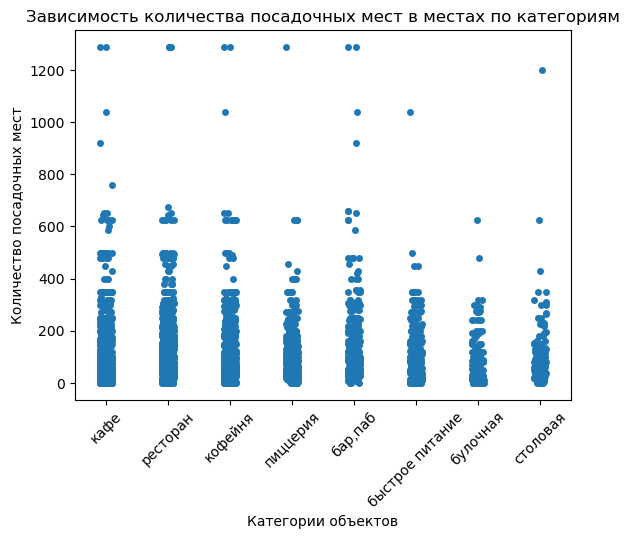

In [45]:
# Построим для каждой категории диаграмму рассеяния
import seaborn as sns
sns.stripplot(x='category', y='seats', data=data)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Зависимость количества посадочных мест в местах по категориям')
plt.xlabel('Категории объектов')
plt.ylabel('Количество посадочных мест')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# отображаем график на экране
plt.show()

In [46]:
# Сгруппируем объекты общественного питания по количеству посадочных мест: средней, медианной, минимальной и максимальной:
data.groupby('category')['seats'].agg(['mean','median', 'min', 'max']).round(0)

,mean,median,min,max
category,,,,
"бар,паб",124.00,82.00,0.00,"1,288.00"
булочная,89.00,50.00,0.00,625.00
быстрое питание,99.00,65.00,0.00,"1,040.00"
кафе,97.00,60.00,0.00,"1,288.00"
кофейня,111.00,80.00,0.00,"1,288.00"
пиццерия,94.00,55.00,0.00,"1,288.00"
ресторан,122.00,86.00,0.00,"1,288.00"
столовая,100.00,76.00,0.00,"1,200.00"


Медианные значения колеблятся около 60-80 посадочных мест по всем категориям.
Среди всех категорий выделяются булочные - у них меньше всех медианное значение посадочных мест и меньше всех максимальное значение - 625.

Общее по всем данным:
* Самое распространненое среди всех типов заведений количество посадочных мест 40, второе место - 100, третье 60.
* у всех категорий минимальное значение равно нулю. Скорее всего это связано с пропусками в данных. И вызывает интерес, что максимальное значение 1288 есть у пяти разных категорий.

Надо проверить. 

In [47]:
# Найдем заведения с максимальным количеством посадочных мест
data.query('seats >= 1250')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
6518,delonixcafe,ресторан,"москва, проспект вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.65,37.48,4.10,высокие,Средний счёт:1500–2000 ₽,"1,750.00",NaN,0,"1,288.00",проспект вернадского,True
6524,ян примус,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.66,37.48,4.50,выше среднего,Средний счёт:1500 ₽,"1,500.00",NaN,1,"1,288.00",проспект вернадского,False
6574,мюнгер,пиццерия,"москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.67,37.49,4.80,NaN,NaN,NaN,NaN,1,"1,288.00",проспект вернадского,False
6641,one price coffee,кофейня,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.67,37.48,4.30,NaN,NaN,NaN,NaN,1,"1,288.00",проспект вернадского,False
6658,гудбар,"бар,паб","москва, проспект вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.67,37.49,4.10,средние,Средний счёт:700 ₽,700.00,NaN,0,"1,288.00",проспект вернадского,False
6684,пивной ресторан,"бар,паб","москва, проспект вернадского, 121, корп. 1",Западный административный округ,NaN,55.66,37.48,4.50,NaN,NaN,NaN,NaN,0,"1,288.00",проспект вернадского,NaN
6690,японская кухня,ресторан,"москва, проспект вернадского, 121, корп. 1",Западный административный округ,NaN,55.66,37.48,4.40,NaN,NaN,NaN,NaN,1,"1,288.00",проспект вернадского,NaN
6771,точка,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,NaN,55.67,37.48,4.70,NaN,NaN,NaN,NaN,1,"1,288.00",проспект вернадского,NaN
6807,loft-cafe академия,кафе,"москва, проспект вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.67,37.48,3.60,NaN,NaN,NaN,NaN,0,"1,288.00",проспект вернадского,False
6808,яндекс лавка,ресторан,"москва, проспект вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.67,37.51,4.00,NaN,NaN,NaN,NaN,1,"1,288.00",проспект вернадского,True


In [48]:
data.query('seats >= 1250').count()

name                 11
category             11
address              11
district             11
hours                 8
lat                  11
lng                  11
rating               11
price                 3
avg_bill              3
middle_avg_bill       3
middle_coffee_cup     0
chain                11
seats                11
street               11
is_24_7               8
dtype: int64

Заведений с максимальным количеством посадочных мест аж 11 шт. и это разные заведения. Но все заведения находятся на проспеке Вернадского. Возможно это какая то техническая ошибка.

Медианные значения колеблятся около 60-80 посадочных мест по всем категориям.
Среди всех категорий выделяются булочные - у них меньше всех медианное значение посадочных мест и меньше всех максимальное значение - 625.

Общее по всем данным - у всех категорий минимальное значение равно нулю. Скорее всего это связано с пропусками в данных.
И вызывает интерес, что максимальное значение 1288 есть у пяти разных категорий.

Самое распространненое среди всех типов заведений количество посадочных мест 40, второе место - 100, третье 60.

Заведений с максимальным количеством посадочных мест аж 11 шт. и это разные заведения. Но все заведения находятся на проспеке Вернадского. Возможно это какая то техническая ошибка.

3.3. Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

In [49]:
# Составим сводную таблицу с соотношением сетевых и несетевых заведений
data_chain = data.pivot_table(index='chain', values='name', aggfunc='count')    
data_chain.rename(index={0:'несетевые', 1:'сетевые'}, inplace= True)
data_chain

,name
chain,
несетевые,5200
сетевые,3203


In [50]:
# Построим круговую диаграмму 
name_chain = ['Несетевые', 'Сетевые']
values_chain = [5201, 3205]
fig = go.Figure(data=[go.Pie(labels=name_chain, values=values_chain)])
fig.update_layout(title='Соотношение сетевых и несетевых заведений', # указываем заголовок графика
                  width=500, # указываем размеры графика
                  height=500,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Тип заведения',
                                    showarrow=False)])
fig.show()


Больше сетевых заведений - 61,9% в количестве 5201шт.

3.4. Найдем категории заведений, которые чаще являются сетевыми. Исследуем данные и построим график.

In [51]:
# Найдем медианные доли сетевых заведений по категориям
data_chain_ratio = data.groupby('category').agg({'chain': 'mean'}).sort_values(by='chain', ascending=False).reset_index().round(2)
data_chain_ratio      

,category,chain
0,булочная,0.61
1,пиццерия,0.52
2,кофейня,0.51
3,быстрое питание,0.38
4,ресторан,0.36
5,кафе,0.33
6,столовая,0.28
7,"бар,паб",0.22


In [52]:
# Построим диаграмму доли сетевых заведений по категориям
fig = px.bar(data_chain_ratio, x='chain', y= 'category', title = 'Доля сетевых заведений по категориям в Москве', text='chain')
fig.update_layout(xaxis_title = 'Доля сетевых заведений',
                  yaxis_title = 'Категория заведений')
fig.show()

Первое место в сетевых организациях - "Булочные" 61% от их общего количества. Второе место - "Пиццерия" 52% от их общего количества. Третье место "Кофейня" - 51% от их общего количества.

3.5. Найдем топ-15 популярных сетей в Москве. Под популярностью будем считать количество заведений этой сети в регионе. Построим визуализацию. 

In [53]:
# Найдем топ-15 популярных сетевых организаций (по количеству заведений)
data_chain_top = data.query('chain == 1').groupby(['name', 'category']).agg({'district':'count'}).reset_index().sort_values(by=['district'], ascending=False).head(15)
data_chain_top

,name,category,district
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


In [54]:
# Построим диаграмму с топ-15 популярных сетевых организаций
fig = px.bar(data_chain_top, x='district', y= 'name', title = 'Топ-15 популярных сетевых организаций в Москве', text='district')
fig.update_layout(xaxis_title = 'Количество заведений в сети',
                  yaxis_title = 'Наименование сети')
fig.show()

Самая большая сеть у кофейни "Шоколадница" - 119 заведений. Второе место у пиццерии "Домино'с Пицца" - 76 заведений. Третье место у пиццерии "Додо Пицца" - 74 заведения.

Самая большая сеть ресторанов - это "Яндекс Лавка" 69 заведений.

Самая большая сеть кафе - это "Кулинарная лавка братьев Караваевых" 39 заведений.

3.6. Найдем административные районы Москвы, которые присутствуют в датасете. Найдем общее количество заведений и количество заведений каждой категории по районам. Проиллюстрируем полученные результаты.

In [55]:
# Найдем административные районы Москвы, которые присутствуют в датасете
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [56]:
data['district'].value_counts()

district
Центральный административный округ         2242
Северный административный округ             899
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: count, dtype: int64

In [57]:
# Найдем количество заведений по административные районы Москвы
data_district = data.groupby(['district','category']).agg({'address':'count'}).reset_index()
data_district = data_district.rename(columns={'address':'count'})
data_district.sort_values(by='count', ascending=False)

,district,category,count
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


In [58]:
# Построим диаграмму распределения заведений по административные районы Москвы
fig = px.bar(data_district.sort_values(by='count', ascending=False), x='count', y='district', color='category',
             width=900, height=750)
fig.update_layout(title='Административные районы Москвы и общее количество заведений по каждой категории',
                  xaxis_title="Количество заведений",
                  yaxis_title="Административный район Москвы")                
fig.show()

Больше всего заведений всех видов в "Центральном административном округе" - 2242 шт. Самые же распространенные это рестораны, кафе и кофейни.

Меньше всего в Северо-Западном административном округе -409 шт.

3.7. Визуализируем распределение средних рейтингов по категориям заведений. Разберемся как различаются усреднённые рейтинги в разных типах общепита.

In [59]:
# Рассмотрим основные данные о столбце rating:
data['rating'].describe()

count   8,403.00
mean        4.23
std         0.47
min         1.00
25%         4.10
50%         4.30
75%         4.40
max         5.00
Name: rating, dtype: float64

In [60]:
# Сгруппируем поле рейтинг по категории заведений и выведем основную информацию:
data.groupby('category').agg({'rating': 'describe'})

rating                                   
                   count mean  std  min  25%  50%  75%  max
category                                                   
бар,паб           764.00 4.39 0.38 1.10 4.30 4.40 4.60 5.00
булочная          256.00 4.27 0.39 1.30 4.20 4.30 4.40 5.00
быстрое питание   603.00 4.05 0.56 1.10 3.90 4.20 4.30 5.00
кафе            2,377.00 4.12 0.57 1.00 4.00 4.20 4.40 5.00
кофейня         1,413.00 4.28 0.37 1.40 4.10 4.30 4.40 5.00
пиццерия          633.00 4.30 0.34 1.00 4.20 4.30 4.40 5.00
ресторан        2,042.00 4.29 0.41 1.00 4.20 4.30 4.50 5.00
столовая          315.00 4.21 0.45 1.00 4.10 4.30 4.40 5.00

In [61]:
# Для удобства восприятия среднего рейтинга создадим сводную таблицу:
data_rating = data.pivot_table(index='category', values = 'rating').reset_index()
data_rating.sort_values(by='rating', ascending=False)

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


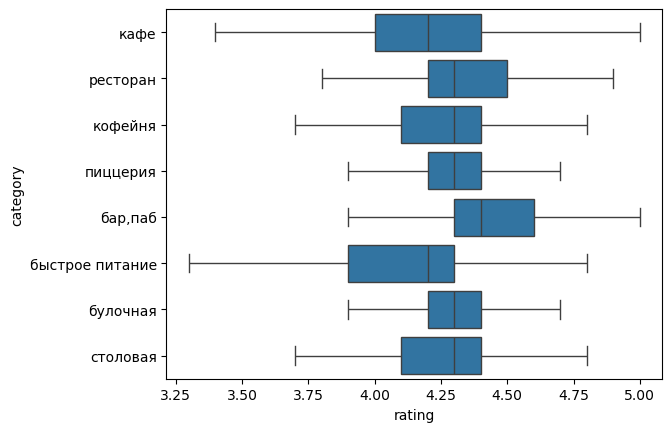

In [62]:
# Построим диаграмму размаха или «ящик с усами» рейтинга по категориям заведений:
# Используем аргумент showfliers=False, чтобы удалить выбросы с графика:
import seaborn as sns
ax = sns.boxplot(x='rating', y='category', data=data, showfliers=False)
plt.show()

Самый высокий средний рейтинг у категории "Бар,паб" - 4,39, самый низкий у заведений быстрого питания - 4,05. Вызывает удивление второе место с конца заведений "Кафе" с рейтингом 4,12, хотя это самое массовое заведение.

Отметим, что максимальный рейтинг 5 есть у каждой категории заведений.

Самый минимальный рейтинг 1 есть у кафе, пиццерий, ресторанов и столовой. У остальных категорий минимальный чуть выше единицы до 1,4 у кофейни.


3.8. Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [63]:
# Сгруппируем поле рейтинг по районам и выведем основную информацию:
data.groupby('district').agg({'rating': 'describe'})

rating                           \
                                           count mean  std  min  25%  50%   
district                                                                    
Восточный административный округ          798.00 4.17 0.48 1.20 4.00 4.30   
Западный административный округ           850.00 4.18 0.52 1.00 4.10 4.30   
Северный административный округ           899.00 4.24 0.42 1.30 4.10 4.30   
Северо-Восточный административный округ   890.00 4.15 0.53 1.00 4.10 4.20   
Северо-Западный административный округ    409.00 4.21 0.47 1.10 4.10 4.30   
Центральный административный округ      2,242.00 4.38 0.28 1.70 4.30 4.40   
Юго-Восточный административный округ      714.00 4.10 0.65 1.00 4.00 4.20   
Юго-Западный административный округ       709.00 4.17 0.54 1.00 4.10 4.30   
Южный административный округ              892.00 4.18 0.45 1.10 4.00 4.30   

                                                   
                                         75%  max  
district                                           
Восточный административный округ        4.40 5.00  
Западный административный округ         4.40 5.00  
Северный административный округ         4.40 5.00  
Северо-Восточный административный округ 4.40 5.00  
Северо-Западный административный округ  4.40 5.00  
Центральный административный округ      4.50 5.00  
Юго-Восточный административный округ    4.40 5.00  
Юго-Западный административный округ     4.40 5.00  
Южный административный округ            4.40 5.00

In [64]:
# Для удобства восприятия среднего рейтинга райнов  и для создания карты хороплет, создадим сводную таблицу:
data_district = data.pivot_table(index='district', values = 'rating').reset_index()
data_district.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [65]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами райнов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m


Самый высокий средний рейтинг в "Центральном административном округе" - 4,38. Самый низкий в "Юго-Восточном административном округе" - 4,10. Остальные районы расположились в этом диапазоне.

3.9. Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [66]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m


Самый высокий средний рейтинг в "Центральном административном округе" - 4,38. На втором месте "Северный административный округ" - 4,24. На третьем "Северо-Западный административный округ" - 4,21.

Самый низкий в "Юго-Восточном административном округе" - 4,10. 

Остальные районы расположились в этом диапазоне.

3.10. Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. Попробуем проиллюстрировать эту информацию одним графиком.

In [67]:
# Найдем топ-15 улиц по количеству заведений Москвы
data_top_streets = data.groupby(['street']).agg({'name':'count'}).reset_index().sort_values(by='name', ascending=False).head(15)
data_top_streets = data_top_streets.rename(columns={'name':'count'})
data_top_streets

,street,count
837,проспект мира,183
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,77
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


In [68]:
# Построим диаграмму с топ-15 улиц по количеству заведений
fig = px.bar(data_top_streets.sort_values(by='count', ascending=True), x='count', y= 'street', title = 'Топ-15 улиц по количеству заведений в Москве', text='count')
fig.update_layout(xaxis_title = 'Количество заведений на улице',
                  yaxis_title = 'Наименование улицы')
fig.show()

На первом месте находится "проспект Мира" - 184 заведения. На втором месте - "Профсоюзная улица" (122 заведения), на третьем "проспект Вернадского" - 108 заведений.

Построим график распределения количества заведений и их категорий по этим улицам.

In [69]:
# Создадим переменную с объединением заведений по улицам и категориям:
data_str_cat = data.groupby(['street', 'category']).agg({'name':'count'}).reset_index().sort_values(by='name', ascending=False)
data_str_cat = data_str_cat.rename(columns={'name':'count'})
data_str_cat

,street,category,count
2137,проспект мира,кафе,53
1520,мкад,кафе,45
2140,проспект мира,ресторан,45
2138,проспект мира,кофейня,36
2149,профсоюзная улица,кафе,35
...,...,...,...
1535,молодёжная улица,"бар,паб",1
1536,молодёжная улица,кофейня,1
1538,монтажная улица,кофейня,1
1539,монтажная улица,ресторан,1


In [70]:
# Сформируем переменную с улицами из топ-15, для этого воспользуемся методом isin(), чтобы проверить наличие конкретных значений: 
data_str_cat_top = data_str_cat[data_str_cat['street'].isin(data_top_streets['street'])]
data_str_cat_top

,street,category,count
2137,проспект мира,кафе,53
1520,мкад,кафе,45
2140,проспект мира,ресторан,45
2138,проспект мира,кофейня,36
2149,профсоюзная улица,кафе,35
...,...,...,...
2120,проспект вернадского,булочная,1
1383,люблинская улица,пиццерия,1
1265,кутузовский проспект,булочная,1
1518,мкад,"бар,паб",1


In [71]:
# Построим диаграмму распределения количественного выражения категорий заведений по улицам топ-15 г. Москва
fig = px.bar(data_str_cat_top.sort_values(by='count', ascending=False), x='count', y='street', color='category',
             width=900, height=750)
fig.update_layout(title='Распределение количественного выражения категорий заведений по улицам топ-15 г. Москва',
                  xaxis_title="Количественное выражение категорий заведений по улицам топ-15",
                  yaxis_title="Наименование топ-15 улиц Москвы",
                  yaxis={'categoryorder':'total ascending'})                
fig.show()

Вывод по пункту

На первом месте находится "проспект Мира" - 183 заведения. На втором месте - "Профсоюзная улица" (122 заведения), на третьем "проспект Вернадского" - 108 заведений.

Распределение заведений по всем улицам достаточно ровно, - в топ-3 стабильно: кафе, ретсоран и кофейня. 
Но выделяется МКАД, на котором 45 кафе из 65 заведений.

3.11. Найдем улицы, на которых находится только один объект общепита.

In [72]:
data_one_street = data.groupby(['street'], as_index = False)['name'].count().query('name==1')
data_one_street

,street,name
0,1-й автозаводский проезд,1
1,1-й балтийский переулок,1
2,1-й варшавский проезд,1
3,1-й вешняковский проезд,1
5,1-й голутвинский переулок,1
...,...,...
1425,электрический переулок,1
1432,юго-западный административный округ,1
1437,якиманский переулок,1
1438,яковоапостольский переулок,1


In [73]:
# Проверим основные данные по получившейся переменной
data_one_street.describe()

,name
count,457.00
mean,1.00
std,0.00
min,1.00
25%,1.00
50%,1.00
75%,1.00
max,1.00


457 улиц с одним заведением

In [74]:
# Создадим переменную с объединением заведений по районам, улицам и категориям:
data_one_street_total = data.groupby(['district', 'street', 'category']).agg({'name':'count'}).reset_index().sort_values(by='name', ascending=False)
data_one_street_total = data_one_street_total.rename(columns={'name':'count'})
data_one_street_total

,district,street,category,count
1374,Северо-Восточный административный округ,проспект мира,кафе,41
3362,Юго-Западный административный округ,профсоюзная улица,кафе,35
1377,Северо-Восточный административный округ,проспект мира,ресторан,34
640,Западный административный округ,проспект вернадского,ресторан,29
3365,Юго-Западный административный округ,профсоюзная улица,ресторан,26
...,...,...,...,...
1651,Северо-Западный административный округ,проспект маршала жукова,быстрое питание,1
1655,Северо-Западный административный округ,проспект маршала жукова,ресторан,1
1656,Северо-Западный административный округ,проспект маршала жукова,столовая,1
1657,Северо-Западный административный округ,светлогорский проезд,кофейня,1


In [75]:
# Сформируем переменную с районами, на которых находится только один объект общепита: 
data_one_street_district = data_one_street_total[data_one_street_total['street'].isin(data_one_street['street'])]
data_one_street_district

,district,street,category,count
3631,Южный административный округ,ереванская улица,булочная,1
3632,Южный административный округ,жуков проезд,кофейня,1
2639,Центральный административный округ,трёхпрудный переулок,"бар,паб",1
2640,Центральный административный округ,турчанинов переулок,"бар,паб",1
2715,Центральный административный округ,улица гашека,кафе,1
...,...,...,...,...
1629,Северо-Западный административный округ,одинцовская улица,столовая,1
1633,Северо-Западный административный округ,парусный проезд,ресторан,1
1645,Северо-Западный административный округ,проезд донелайтиса,быстрое питание,1
1657,Северо-Западный административный округ,светлогорский проезд,кофейня,1


In [76]:
# Сгруппируем улицы с одним заведениям по районам:
data_one_street_district_final = data_one_street_district.groupby('district').agg({'count':'count'}).reset_index().sort_values(by = 'count' ,ascending=False)
data_one_street_district_final

,district,count
5,Центральный административный округ,145
3,Северо-Восточный административный округ,55
0,Восточный административный округ,52
2,Северный административный округ,51
8,Южный административный округ,43
6,Юго-Восточный административный округ,39
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,18


In [77]:
# Построим диаграмму c группировкой улиц с одним заведениям по районам:
fig = px.bar(data_one_street_district_final.sort_values(by='count', ascending=True), x='count', y= 'district', title = 'Группировка улиц с одним заведениям по районам', text='count')
fig.update_layout(xaxis_title = 'Количество улиц с одним заведениям в районе',
                  yaxis_title = 'Наименование района')
fig.show()

Больше всего улиц с одним заведением в "Центральном административном округе". Возможно это связано с высокой стоимостью аренды.

In [78]:
# Сгруппируем улицы с одним заведениям по категориям:
data_one_street_category_final = data_one_street_district.groupby('category').agg({'count':'count'}).reset_index().sort_values(by = 'count' ,ascending=False)
data_one_street_category_final

,category,count
3,кафе,159
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


In [79]:
# Построим диаграмму c группировкой улиц с одним заведениям по категориям:
fig = px.bar(data_one_street_category_final.sort_values(by='count', ascending=True), x='count', y= 'category', title = 'Группировка улиц с одним заведениям по категориям', text='count')
fig.update_layout(xaxis_title = 'Количество улиц с одним заведениям по категориям',
                  yaxis_title = 'Наименование категории заведения')
fig.show()

Чаще всего по одному заведению на улице находятся кафе.

Больше всего улиц с одним заведением в "Центральном административном округе". Возможно это связано с высокой стоимостью аренды.

Чаще всего по одному заведению на улице находятся кафе.

3.12. Посчитаем медиану значений средних чеков заведений для каждого района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены и как удалённость от центра влияет на цены в заведениях.

In [80]:
# Посчитаем медиану среднего чека для каждого района
data_middle_avg_bill = data.groupby('district', as_index=False)['middle_avg_bill'].median().sort_values(by='middle_avg_bill', ascending=False)
data_middle_avg_bill

,district,middle_avg_bill
1,Западный административный округ,"1,000.00"
5,Центральный административный округ,"1,000.00"
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


In [81]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами райнов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана среднего чека для каждого района',
).add_to(m)

# выводим карту
m

Краткий вывод по пункту
Самый дорогой средний чек: "Западный административный округ" и "Центральный административный округ" - 1000 рублей.

Самый дешевый средний чек в "Юго-Восточном административном округе" - 450 рублей.

Чем дальше от центра и ближе к южным районам, тем ниже стоимость среднего чека.

3.13. Найдем часы работы кофеин с высоким рейтингом

In [82]:
# Создадим переменную, где отберем одни кофейни
data_coffee_house = data.query('category == "кофейня"')
data_coffee_house.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.89,37.51,4.00,NaN,NaN,NaN,NaN,1,46.00,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.88,37.49,3.60,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.88,37.48,3.80,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False


In [83]:
# Рассмотрим основную информацию о кофейнях
data_coffee_house.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,"1,413.00","1,413.00","1,413.00",200.00,521.00,"1,413.00",751.00
mean,55.76,37.60,4.28,614.21,175.06,0.51,111.20
std,0.06,0.09,0.37,501.08,89.75,0.50,127.84
min,55.58,37.37,1.40,0.00,60.00,0.00,0.00
25%,55.72,37.54,4.10,300.00,124.00,0.00,40.00
50%,55.76,37.60,4.30,400.00,170.00,1.00,80.00
75%,55.80,37.66,4.40,750.00,225.00,1.00,144.00
max,55.92,37.86,5.00,"2,500.00","1,568.00",1.00,"1,288.00"


Только 25% кофеин имеют рейтинг больше 4.4. Ориентироваться надо на топовые заведения. Создадим новый датафрейм

In [84]:
# Найдем кофейни, коорые имеют рейтинг больше 4.4:
data_coffee_house_rating = data_coffee_house.query('rating > 4.4')
data_coffee_house_rating

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.90,37.57,4.90,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False
66,молинари,кофейня,"москва, алтуфьевское шоссе, 70, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.89,37.59,4.80,NaN,NaN,NaN,NaN,0,120.00,алтуфьевское шоссе,False
72,лакрица,кофейня,"москва, алтуфьевское шоссе, 85",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.89,37.59,4.50,средние,Цена чашки капучино:150–190 ₽,NaN,170.00,0,12.00,алтуфьевское шоссе,False
89,сахарочек,кофейня,"москва, дмитровское шоссе, 107а, корп. 2",Северный административный округ,пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00,55.88,37.54,4.50,средние,Цена чашки капучино:100–200 ₽,NaN,150.00,0,120.00,дмитровское шоссе,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8301,кофейня 1981,кофейня,"москва, 2-й грайвороновский проезд, 44, корп. 1",Юго-Восточный административный округ,"ежедневно, 08:00–22:00",55.73,37.75,4.50,NaN,Цена чашки капучино:160–230 ₽,NaN,195.00,0,NaN,2-й грайвороновский проезд,False
8308,бариста стайл,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,пн-пт 07:00–18:00,55.72,37.72,4.90,NaN,Цена чашки капучино:130–170 ₽,NaN,150.00,0,NaN,новохохловская улица,False
8348,bonjour,кофейня,"москва, шоссейная улица, 8",Юго-Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 08:00–21:00",55.69,37.73,4.70,средние,Цена чашки капучино:130–190 ₽,NaN,160.00,0,NaN,шоссейная улица,False
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.68,37.74,4.50,NaN,NaN,NaN,NaN,0,NaN,люблинская улица,False


Получилось 336 кофеин. Найдем топ-15 встречаемых часов работы кофеин с рейтингом выше 4.4

In [85]:
# Найдем топ-15 встречаемых часов работы кофеин с рейтингом выше 4.4
data_coffee_house_hours = data_coffee_house_rating.groupby('hours')['name'].count().reset_index().sort_values(by='name',ascending=False).head(15)
data_coffee_house_hours = data_coffee_house_hours.rename(columns={'name':'count'})
data_coffee_house_hours

,hours,count
25,"ежедневно, 10:00–22:00",23
82,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",18
20,"ежедневно, 09:00–21:00",17
75,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",16
13,"ежедневно, 08:00–22:00",13
12,"ежедневно, 08:00–21:00",11
21,"ежедневно, 09:00–22:00",11
14,"ежедневно, 08:00–23:00",10
31,"ежедневно, круглосуточно",10
85,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",9


In [86]:
# Построим диаграмму распределения топ-15 встречаемых часов работы кофеин с рейтингом выше 4.4
fig = px.bar(data_coffee_house_hours.sort_values(by='count', ascending=True), x='count', y='hours',
             width=900, height=750)
fig.update_layout(title='Распределение топ-15 встречаемых часов работы кофеин с рейтингом выше 4.4 г.Москва',
                  xaxis_title="Количество кофеин",
                  yaxis_title="Время работы")                
fig.show()

На первом месте часы работы - ежедневно, 10:00–22:00. На втором месте - пн-пт 08:00–22:00; сб,вс 09:00–22:00. На третьем ежедневно, 09:00–21:00.

Выводы по пункту 3:

3.1. Категории заведений:

* Больше всего открыто "Кафе" 28,3% (2378 шт.). На втором месте идут "Рестораны" 24,3% (2043 шт.). На третьем "Кофейни" 16,8% (1413 шт.).

3.2. Посадочные места:

* Медианные значения посадочных мест колеблются около 60-80 по всем категориям. Среди всех категорий выделяются булочные - у них меньше всех медианное значение посадочных мест и меньше всех максимальное значение псоадочных мест - 625.
* Самое распространненое среди всех типов заведений количество посадочных мест 40, второе место - 100, третье 60.
* у всех категорий минимальное значение посадочных мест равно нулю. Скорее всего это связано с пропусками в данных. И вызывает интерес, что максимальное значение 1288 есть у пяти разных категорий. Заведений с максимальным количеством посадочных мест аж 11 шт. и это разные заведения. Но все заведения находятся на проспеке Вернадского. Возможно это какая то техническая ошибка.

3.3. Соотношение сетевых и несетевых заведений: 

* Больше сетевых заведений - 61,9% в количестве 5201шт. Несетевых соответственно 38,1% (3205шт.)

3.4. Категории заведений, которые чаще являются сетевыми: 

* Первое место в сетевых организациях - "Булочные" 61% от их общего количества. Второе место - "Пиццерия" 52% от их общего количества. Третье место "Кофейня" - 51% от их общего количества.

3.5. Топ-15 популярных сетей:

* Самая большая сеть у кофейни "Шоколадница" - 119 заведений. Второе место у пиццерии "Домино'с Пицца" - 76 заведений. Третье место у пиццерии "Додо Пицца" - 74 заведения.
* Самая большая сеть ресторанов - это "Яндекс Лавка" 69 заведений.
* Самая большая сеть кафе - это "Кулинарная лавка братьев Караваевых" 39 заведений.

3.6. Распределение заведений по административным районам:

* Больше всего заведений всех видов в "Центральном административном округе" - 2242 шт. Самые же распространенные это рестораны, кафе и кофейни.
* Меньше всего в Северо-Западном административном округе -409 шт.

3.7. Средний рейтинг по категориям заведений:

* Самый высокий средний рейтинг у категории "Бар,паб" - 4,39, самый низкий у заведений быстрого питания - 4,05. Вызывает удивление второе место с конца заведений "Кафе" с рейтингом 4,12, хотя это самое массовое заведение.
* Отметим, что максимальный рейтинг 5 есть у каждой категории заведений.
* Самый минимальный рейтинг 1 есть у кафе, пиццерий, ресторанов и столовой. У остальных категорий минимальный чуть выше единицы и до 1,4 у кофейни.

3.8. Средний рейтинг заведений каждого района:

* Самый высокий средний рейтинг в "Центральном административном округе" - 4,38. Самый низкий в "Юго-Восточном административном округе" - 4,10. Остальные районы расположились в этом диапазоне.

3.9. Карта хороплет со всеми заведениями датасета на карте с помощью кластеров построена.

3.10. Топ-15 улиц по количеству заведений:

* На первом месте находится "проспект Мира" - 184 заведения. На втором месте - "Профсоюзная улица" (122 заведения), на третьем "проспект Вернадского" - 108 заведений.
* Распределение заведений по всем улицам достаточно ровно, - в топ-3 стабильно: кафе, ретсоран и кофейня. Но выделяется МКАД, на котором 45 кафе из 65 заведений.

3.11. Улицы, на которых находится только один объект общепита:

* Больше всего улиц с одним заведением в "Центральном административном округе". Возможно это связано с высокой стоимостью аренды.
* Чаще всего по одному заведению на улице находятся кафе.

3.12. Медианы значений средних чеков заведений для каждого района:

* Самый дорогой средний чек: "Западный административный округ" и "Центральный административный округ" - 1000 рублей.
* Самый дешевый средний чек в "Юго-Восточном административном округе" - 450 рублей.
* Чем дальше от центра и ближе к южным районам, тем ниже стоимость среднего чека.

3.13. Часы работы кофеин с высоким рейтингом:

* Только 25% кофеин имеют рейтинг больше 4.4. Получилось 336 кофеин.
* Из топ-15 встречаемых часов работы кофеин с рейтингом выше 4.4 на первом месте часы работы - ежедневно, 10:00–22:00. На втором месте - пн-пт 08:00–22:00; сб,вс 09:00–22:00. На третьем ежедневно, 09:00–21:00.

3.14. Общий вывод

* Общим выводом по проделанному исследованию можно сказать, что самый высоский средний чек заведений находится в центре г. Москва и также в центре самый высокий рейтинг заведений. То есть если открывть заведения в центре, то нужно будет поддерживать высокий уровень заведения, чтобы держать конкуренцию.
* Выделяется Юго-восточное направление. Там самы низкие рейтинги и самые низсикй средний чек. Связь получается линейная между рейтингом и ценой среднего чека.
* Конкуренция по всем заведениям очень высокая. Сетевых организаций много во всех категориях. 
* Есть улицы с одним заведением. Возможно на то есть причины, но считаю данную территорию наиболее привлекательной для открытия.

4. Цель - открытие кофейни.

В пункте 3.13. я уже провел частично исследование кофеин и создал отдельный датасет. Напишем еще раз основною информацию по нему.

In [87]:
# Рассмотрим основную информацию о кофейнях
data_coffee_house.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,"1,413.00","1,413.00","1,413.00",200.00,521.00,"1,413.00",751.00
mean,55.76,37.60,4.28,614.21,175.06,0.51,111.20
std,0.06,0.09,0.37,501.08,89.75,0.50,127.84
min,55.58,37.37,1.40,0.00,60.00,0.00,0.00
25%,55.72,37.54,4.10,300.00,124.00,0.00,40.00
50%,55.76,37.60,4.30,400.00,170.00,1.00,80.00
75%,55.80,37.66,4.40,750.00,225.00,1.00,144.00
max,55.92,37.86,5.00,"2,500.00","1,568.00",1.00,"1,288.00"


Всего кафеин в исследуемых данных 1413 шт.

Найдем их расположение по районам

In [88]:
# Сгруппируем данные по районам
data_c_h__district = data_coffee_house.groupby('district')['name'].count().reset_index().sort_values(by='name',ascending=False)
data_c_h__district = data_c_h__district.rename(columns={'name':'count'})
data_c_h__district

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [89]:
# Построим диаграмму c группировкой кофеин по районам:
fig = px.bar(data_c_h__district.sort_values(by='count', ascending=True), x='count', y= 'district', title = 'Группировка количества кофеин по районам', text='count')
fig.update_layout(xaxis_title = 'Количество кофеин',
                  yaxis_title = 'Наименование района')
fig.show()

Больше всего кофеин в "Центральном административном округе" - 428. Меньше всего в "Северо-Западном административном округе"

In [90]:
# Найдем круглосуточные кофейни:
data_coffee_house.query('is_24_7==True')['name'].reset_index().count()

index    59
name     59
dtype: int64

Круглосуточных кофеин 59 шт.

In [91]:
# Найдем  рейтинги кофеен и их распределение по районам.
data_c_h__dist_rat = data_coffee_house.groupby(['district']).agg({'rating':'describe'}).reset_index()
data_c_h__dist_rat

district rating                           \
                                            count mean  std  min  25%  50%   
0         Восточный административный округ 105.00 4.28 0.38 3.00 4.10 4.30   
1          Западный административный округ 150.00 4.20 0.36 2.30 4.03 4.20   
2          Северный административный округ 193.00 4.29 0.44 2.00 4.10 4.30   
3  Северо-Восточный административный округ 159.00 4.22 0.43 1.40 4.10 4.30   
4   Северо-Западный административный округ  62.00 4.33 0.43 2.00 4.20 4.30   
5       Центральный административный округ 428.00 4.34 0.26 2.30 4.20 4.30   
6     Юго-Восточный административный округ  89.00 4.23 0.51 2.30 4.10 4.30   
7      Юго-Западный административный округ  96.00 4.28 0.30 3.30 4.10 4.30   
8             Южный административный округ 131.00 4.23 0.39 2.00 4.10 4.30   

             
   75%  max  
0 4.40 5.00  
1 4.38 5.00  
2 4.50 5.00  
3 4.40 5.00  
4 4.50 5.00  
5 4.40 5.00  
6 4.50 5.00  
7 4.50 5.00  
8 4.40 5.00

In [92]:
# Для удобства восприятия среднего рейтинга райнов  и для создания карты хороплет, создадим сводную таблицу:
data_c_h__median = data_coffee_house.pivot_table(index='district', values = 'rating').reset_index()
data_c_h__median.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


Построим фоновую картограмму (хороплет) со средним рейтингом кофеин каждого района.

In [93]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами райнов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_c_h__median,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеин по районам',
).add_to(m)

# выводим карту
m

Самые высокие рейтинги в "Центральном административном округе" (4,34) и в "Северо-Западном административном округе" (4,33)

In [94]:
# Найдем среднюю чашку кофе в кофейнях
data_coffee_house['middle_coffee_cup'].describe()

count     521.00
mean      175.06
std        89.75
min        60.00
25%       124.00
50%       170.00
75%       225.00
max     1,568.00
Name: middle_coffee_cup, dtype: float64

Медианная цена одной чашки кофе в кофейнях 175 рублей.
Максимальная 1568 рублей.
Минимальная 60 рублей.

Найдем распределение чашек кофе по районам

In [95]:
# Для удобства восприятия среднего чека кофе  и для создания карты хороплет, создадим сводную таблицу:
data_c_h__cup = data_coffee_house.pivot_table(index='district', values = 'middle_coffee_cup').reset_index()
data_c_h__cup.sort_values(by='middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


In [96]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами райнов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_c_h__cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя цена чашки кофе в кофейнях по районам',
).add_to(m)

# выводим карту
m

Найдем улицы, на которых нет кофеин

In [97]:
# Всего улиц в данных:
data['street'].describe()

count               8403
unique              1447
top        проспект мира
freq                 183
Name: street, dtype: object

Всего улиц в данных 1448.
Кофеин всего 1413.
Получается, что должно быть минимум 35 улиц, на которых не должно быть кофеин. Попробуем их найти.

In [98]:
data.groupby(['street', 'category'], as_index = False)['name'].count().query('category != "кофейня" and name == 0')

,street,category,name


Удивительно, но улиц, где нет кофеин запрос не выдал. (если задать кофейни с 1-м заведением выдает 371 кофейню)

Найдем улицы, на которых есть 1 кофейня

In [99]:
data_one_street_c_h = data_coffee_house.groupby(['street'], as_index = False)['name'].count().query('name==1')
data_one_street_c_h

,street,name
0,1-й волоколамский проезд,1
1,1-й колобовский переулок,1
2,1-й магистральный тупик,1
3,1-й нагатинский проезд,1
4,1-й неопалимовский переулок,1
...,...,...
613,шоссейная улица,1
614,щербаковская улица,1
618,электрозаводская улица,1
622,яковоапостольский переулок,1


371 улица, где есть хотя бы одна кофейня

In [100]:
# Создадим переменную с объединением кофеин по районам и по улицам
data_one_street_c_h_total = data_coffee_house.groupby(['district', 'street']).agg({'name':'count'}).reset_index().sort_values(by='name', ascending=False)
data_one_street_c_h_total = data_one_street_c_h_total.rename(columns={'name':'count'})
data_one_street_c_h_total

,district,street,count
151,Северный административный округ,ленинградский проспект,25
232,Северо-Восточный административный округ,проспект мира,19
557,Юго-Западный административный округ,ленинский проспект,18
567,Юго-Западный административный округ,профсоюзная улица,18
428,Центральный административный округ,проспект мира,17
...,...,...,...
271,Северо-Западный административный округ,волоколамское шоссе,1
270,Северо-Западный административный округ,вишнёвая улица,1
268,Северо-Западный административный округ,авиационная улица,1
266,Северо-Западный административный округ,3-й силикатный проезд,1


In [101]:
# Сформируем переменную с районами, на которых находится только одна кофейня: 
data_one_street_district_c_h = data_one_street_c_h_total[data_one_street_c_h_total['street'].isin(data_one_street_c_h['street'])]
data_one_street_district_c_h

,district,street,count
406,Центральный административный округ,никитский переулок,1
412,Центральный административный округ,новоселенский переулок,1
411,Центральный административный округ,новорязанская улица,1
440,Центральный административный округ,самотёчная улица,1
452,Центральный административный округ,сущёвская улица,1
...,...,...,...
272,Северо-Западный административный округ,карамышевская набережная,1
270,Северо-Западный административный округ,вишнёвая улица,1
268,Северо-Западный административный округ,авиационная улица,1
266,Северо-Западный административный округ,3-й силикатный проезд,1


In [102]:
# Сгруппируем улицы с одной кофейней по районам:
data_one_street_district_c_h_final = data_one_street_district_c_h.groupby('district').agg({'count':'count'}).reset_index().sort_values(by = 'count' ,ascending=False)
data_one_street_district_c_h_final

,district,count
5,Центральный административный округ,117
2,Северный административный округ,47
0,Восточный административный округ,39
3,Северо-Восточный административный округ,38
8,Южный административный округ,30
6,Юго-Восточный административный округ,28
1,Западный административный округ,27
7,Юго-Западный административный округ,23
4,Северо-Западный административный округ,22


Построим карту хороплет

In [103]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами райнов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_one_street_district_c_h_final,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество улиц с одной кофейней по районам',
).add_to(m)

# выводим карту
m

Больше всего улиц (с огромным отрывом) с 1 кофейней в "Центральном административном округе" - 117шт.
На втором месте "Северный административный округ" - 47 шт.
На третьем "Восточный административный округ" - 39 шт.	

Выводы по пункту 4:

* Всего кофеин в исследуемых данных 1413 шт.
* Больше всего кофеин в "Центральном административном округе" - 428. Меньше всего в "Северо-Западном административном округе"
* Круглосуточных кофеин 59 шт.
* Самые высокие рейтинги в "Центральном административном округе" (4,34) и в "Северо-Западном административном округе" (4,33)
* Медианная цена одной чашки кофе в кофейнях 175 рублей.
* Максимальная 1568 рублей.
* Минимальная 60 рублей.
* Улиц где нет кофеин ноль шт.
* Улиц с одной кофейней - 371шт.
* Больше всего улиц (с огромным отрывом) с 1 кофейней в "Центральном административном округе" - 117шт.На втором месте "Северный административный округ" - 47 шт. На третьем "Восточный административный округ" - 39 шт.	

Итоговая рекомендация по исследованию:
Так как улиц, на которых количество кофеин равно нулю, считаю приоритетным рассмотреть улицы и районы где есть одна кофейня. Центральный район г. Москвы очень перенасыщен всеми видами заведений в том числе и кофейнями.

Считаю, самым оптимальным районом для открытия кофейни "Северный административный округ". Это связано со следующими факторами:
* Там есть 47 улиц, на которых всего 1 кофейня - это второй показатель по всем районам;
* Средняя цена чашки здесь чуть ниже медианной 175рублей и составляет 165.79. но и не самая низкая 151 рубль, как например в "Юго-Восточном административном округе";
* Средний рейтинг кофеин не самый высокий - 4.29, при средних рейтингах от 4,20 до 4,34. То есть это дает возможность конкурировать новым заведениям.

Общие рекомендации по кофейне:
* Часы работы кофеин рекомендую ежедневно, 10:00–22:00, либо с 08:00–22:00;
* Количество посадочных мест от 80 до 144 (это от 50 до 75% процентов всех кофеин, а медианное равняется 111). Это позволит не только принимать посетителей, но и проводить праздничные банкеты и мероприятия.

Презентация: https://disk.yandex.ru/i/9sueNy_fHTEiZA